
# IMAGE PROCESSING PROJECT

In [1]:
######### VISUALIZATION ###############
% matplotlib inline
% pprint off
# Import the library as show images, plot, etc.
import matplotlib.pyplot as plt
# Import functionality for the color map
import matplotlib.cm as cm
from IPython import display
import pylab as pl
######################################

############ SYSTEM ##############
import sys 
import time
#################################

############ LINEAR ALGEBRA ##############
import scipy as sp
from scipy import ndimage
##########################################

############ NUMPY ##############
import numpy as np
#################################

############ SKIIMAGE MODULES ##############
## Module to read, write,... 
from skimage import io
## Module to convert the image on 8 bits
from skimage import img_as_ubyte
## Module to convert the image to float
from skimage import img_as_float
## Module for color conversion 
from skimage import color
## Module for drawing
from skimage import draw
## Module to transform the image (image enhancement)
from skimage import exposure
## Module to apply filters 
from skimage import filters

from skimage import morphology

from skimage import transform
##########################################


#Disable warnings
import warnings
warnings.filterwarnings("ignore")

Pretty printing has been turned OFF


# 1 - Energy function

## 1.1 - Implementation

In [2]:
def energy_map(img):
    """
    Parameters
    ==========
    img: numpy.array with len(shape) = 2 or 3 
    :returns 2-D numpy array where 
        Each energy[x][y] is the energy of that pixel
    """
    shape = img.shape
    
    #create return image
    energy_image = np.zeros((shape[0],shape[1]))
    
    #derivatives x and y
    dx = np.array([[1,0,-1]])/2
    dy = dx.T
    
    #Check image shape
    if len(shape) == 3:
        #color image
        for ch in range(shape[2]):
            img_dx = ndimage.filters.convolve(img[:,:,ch],dx)
            img_dy = ndimage.filters.convolve(img[:,:,ch],dy)
            energy_image+= (abs(img_dx)+abs(img_dy))
    else:
        #grey
        img_dx = ndimage.filters.convolve(img,dx)
        img_dy = ndimage.filters.convolve(img,dy)
        energy_image+= (abs(img_dx)+abs(img_dy))
    
    return energy_image

### 1.1.1 Testing

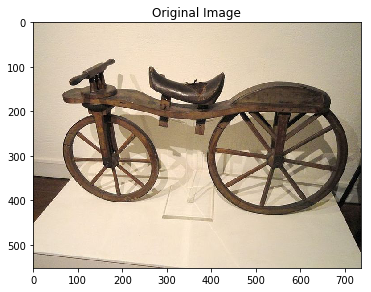

Image Shape : (552, 736, 3)


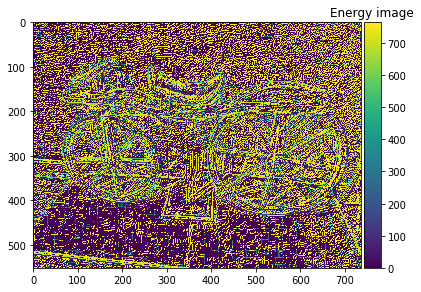

In [31]:
#Load image
image = io.imread('images/b.jpg')
plt.figure()
io.imshow(image)
plt.title('Original Image')
plt.show() #Avoid object information

print("Image Shape : "+str(image.shape))

#Compute energy map
energy_image = energy_map(image)
#Show it
plt.figure()
io.imshow(energy_image)
plt.title('Energy image')
plt.show()


# 2 - Cumulative energy

## 2.1 - Implementation

In [4]:
def dynamic_energy_vertical(energy_map):
    """
     Parameters
    ==========
    energy_map: numpy.array representing the energy map of the image 
    :returns two 2-D numpy array as the comulative energy and the path ( for each
        pixel the column of the last row where the minimum energy has been found)
    
    (yes.... I'm not good explaining)
    """
    shape = energy_map.shape
    cumulative_energy = np.zeros((shape[0],shape[1]))
    path = np.zeros((shape[0],shape[1]),dtype=np.int16)
    #Path, for each pixel the value is the column index of the min value
    # of the last row (only the 3-connected pixels above are allowed). This 
    # allows to find the minimum path without computing again the image
    
    #Init the first row
    cumulative_energy[0,:] = energy_map[0,:]
    
    for i in range(1,shape[0]): #up to down
        for j in range(0,shape[1]): #left to right
            prev_energy_arr = cumulative_energy[i-1][max(0,j-1):min(shape[1]-1,j+2)] # prev energy arr. We must take of idx < 0. The other side is automatically cropped in case 
            prev_min_energy = np.min(prev_energy_arr) # find min value
            prev_min_energy_idx = np.argmin(prev_energy_arr) # Find index min

            cumulative_energy[i][j] = energy_map[i][j] + prev_min_energy
            idx_sub = 1 if j > 0 else 0
            path[i][j] = j+(prev_min_energy_idx-idx_sub) #index is 0 1 or 2, acording to left, middle or right
    
    return cumulative_energy, path


In [5]:
def dynamic_energy_horizontal(energy_map):
    cumulative_energy, path = dynamic_energy_vertical(energy_map.T)
    return cumulative_energy.T, path.T


### 2.1.2 - Testing

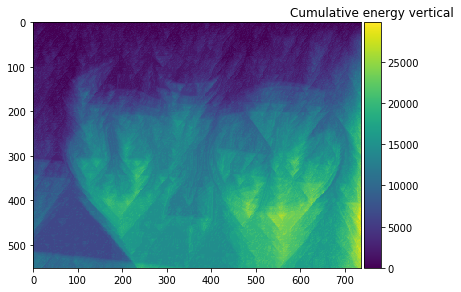

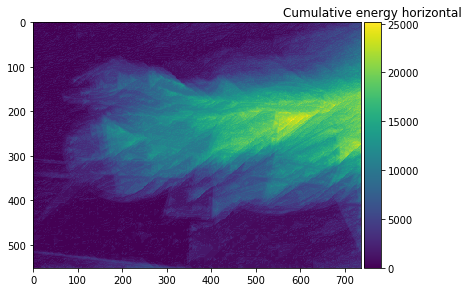

In [32]:
cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)

io.imshow(cumulative_energy_v)
plt.title('Cumulative energy vertical')
plt.show()
# It's dificult to see, but make sense if you see that the energy map has
# almost no energy on the right of the castle, so here the cumulative energy
# color is close to 0, and the paths are almost vertical because we can see that
# it keeps low values in all the column.

cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
plt.plot()

io.imshow(cumulative_energy_h)
plt.title('Cumulative energy horizontal')
plt.show()


# 3 - Deletion

## 3.1 Horizontal and Vertical Independently (Minimum seam)

### 3.1.1 Implementation

In [8]:
def delete_minimum_vertical_path(cumulative_energy, path, image):
    """
    returns the image with the minimum path painted in red
    """
    shape = image.shape # (height, width) or (rows, cols)
    #Copy the image
    if len(shape) == 3:
        ret_image = np.zeros((shape[0],shape[1]-1,shape[2]),dtype=image.dtype)
    else:
        ret_image = np.zeros((shape[0],shape[1]-1),dtype=image.dtype)
        
    # find the minimum value in the last row of the cumulative energy image
    seam_row = shape[0]-1 
    seam_col = np.argmin(cumulative_energy[-1]) # or cumulative_energy[seam_row]
    
    #Go through all the seams
    while seam_row >= 0:
        ret_image[seam_row] = np.delete(image[seam_row],seam_col,0)
        #Find next seam (Actually the last one..) for the next iteration
        seam_col = path[seam_row][seam_col]
        seam_row -= 1 
    
    return ret_image

In [9]:
def delete_minimum_horizontal_path(cumulative_energy,path,image):
    return delete_minimum_vertical_path(cumulative_energy.T,path.T,image.transpose(1,0,2)).transpose(1,0,2)

#### Also, we implement methods for visualization

In [10]:
def draw_minimum_vertical_path(cumulative_energy, path, image):
    """
    returns the image with the minimum path painted in red
    """
    #Copy the image
    ret_image = np.copy(image)
    
    shape = image.shape # (height, width) or (rows, cols)
    # find the minimum value in the last row of the cumulative energy image
    seam_row = shape[0]-1 
    seam_col = np.argmin(cumulative_energy[-1]) # or cumulative_energy[seam_row]
    
    #Go through all the seams
    while seam_row >= 0:
        ret_image[seam_row][seam_col] = np.array([255, 0, 0])
        #Find next seam (Actually the last one..) for the next iteration
        seam_col = path[seam_row][seam_col]
        seam_row -= 1 
    
    return ret_image
        

In [11]:
def draw_minimum_horizontal_path(cumulative_energy, path, image):
    return draw_minimum_vertical_path(cumulative_energy.T,path.T,image.transpose(1,0,2)).transpose(1,0,2)

### 3.1.2 Testing

#### Visualization

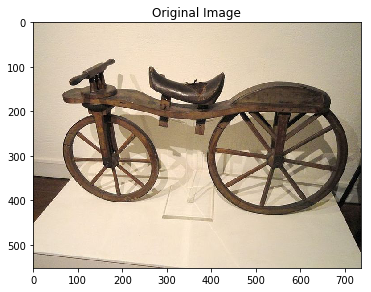

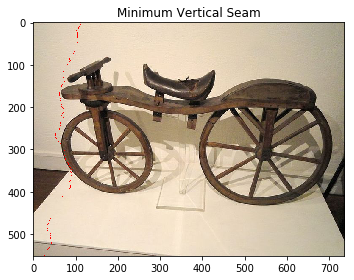

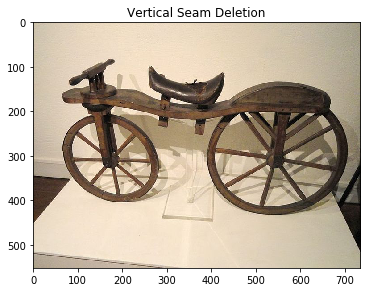

Vertical Seam Deletion Shape: (552, 735, 3)


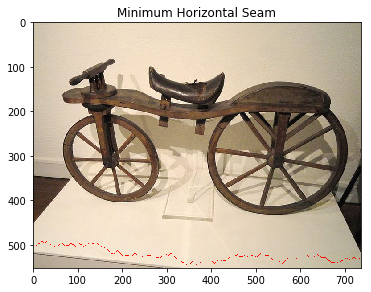

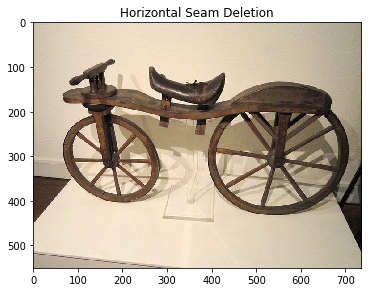

Horizontal Seam Deletion Shape: (551, 736, 3)


In [33]:
io.imshow(image)
plt.title('Original Image')
plt.figure()

view = image
seam_image = draw_minimum_vertical_path(cumulative_energy_v, path_v, view)
plt.title('Minimum Vertical Seam')
io.imshow(seam_image)
io.show()

#Deleting 1 seam
crop_image = delete_minimum_vertical_path(cumulative_energy_v, path_v, image)
io.imshow(crop_image)
plt.title('Vertical Seam Deletion')
io.show()
print('Vertical Seam Deletion Shape: '+str(crop_image.shape))

#Seeems that there are missing red pixels, check the image exported, is ok!
io.imsave('images/minimum_seam_v.jpg',seam_image)



seam_image = draw_minimum_horizontal_path(cumulative_energy_h, path_h, view)
io.imshow(seam_image)
plt.title('Minimum Horizontal Seam')
io.show()

#Deleting 1 seam
crop_image = delete_minimum_horizontal_path(cumulative_energy_h, path_h, image)
io.imshow(crop_image)
plt.title('Horizontal Seam Deletion')
io.show()
print('Horizontal Seam Deletion Shape: '+str(crop_image.shape))


#Seeems that there are missing red pixels, check the image exported, is ok!

io.imsave('images/minimum_seam_h.jpg',seam_image)



## 3.2 Multiple Seams Deletion

### 3.2.1 Implementaton

In [14]:
def delete_seams_horizontal(image, cols):
    crop_image = image
    energy_image = energy_map(crop_image)

    for i in range(cols):
        cumulative_energy, path = dynamic_energy_vertical(energy_image)
        crop_image = delete_minimum_vertical_path(cumulative_energy, path, crop_image)
        energy_image = energy_map(crop_image)
    
    return crop_image

In [15]:
def delete_seams_vertical(image, rows):
    crop_image = image
    energy_image = energy_map(crop_image)

    for i in range(rows):
        cumulative_energy, path = dynamic_energy_horizontal(energy_image)
        crop_image = delete_minimum_horizontal_path(cumulative_energy, path, crop_image)
        energy_image = energy_map(crop_image)
    
    return crop_image

### 3.2.2 Testing

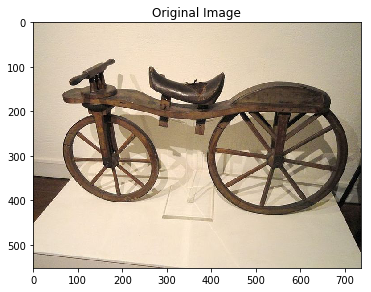

Original Shape: (552, 736, 3)


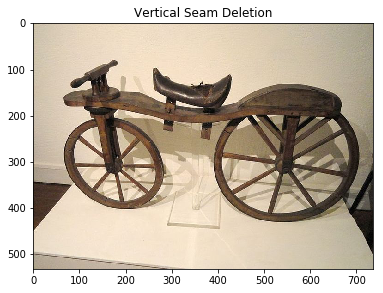

Vertical Seam Deletion Shape: (532, 736, 3)


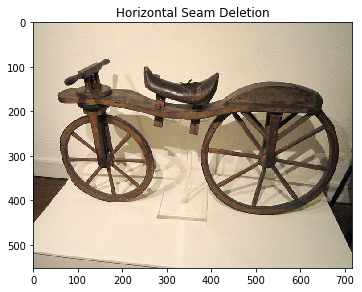

Vertical Seam Deletion Shape: (552, 716, 3)


In [34]:
#Deleting multiple seam

io.imshow(image)
plt.title('Original Image')
io.show()
print('Original Shape: '+str(image.shape))

vertical_seams = 20
crop_image = delete_seams_vertical(image,vertical_seams)
io.imshow(crop_image)
plt.title('Vertical Seam Deletion')
io.show()
io.imsave('images/vertical_deletion.jpg',crop_image)
print('Vertical Seam Deletion Shape: '+str(crop_image.shape))

#Deleting 1 seam
horizontal_seams = 20
crop_image = delete_seams_horizontal(image, horizontal_seams)
io.imshow(crop_image)
plt.title('Horizontal Seam Deletion')
io.show()
io.imsave('images/horizontal_deletion.jpg',crop_image)
print('Vertical Seam Deletion Shape: '+str(crop_image.shape))


## 3.3 Multiple Seams (Horizontal & Vertical Combination)

### 3.3.1 Implementation

In [17]:

def deletion(image,rows,cols):
    crop_image = image
    energy_image = energy_map(crop_image)

    cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)
    cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)

    while(cols+rows != 0):
        if(cols == 0):
            
            crop_image = delete_minimum_horizontal_path(cumulative_energy_h, path_h, crop_image)
            energy_image = energy_map(crop_image)
            cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
            cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image) 
            rows=rows-1
        elif(rows == 0):

            crop_image = delete_minimum_vertical_path(cumulative_energy_v, path_v, crop_image)
            energy_image = energy_map(crop_image)
            cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)
            cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
            cols = cols-1

        else:    
            min_cumulative_v = np.argmin(cumulative_energy_v[-1])
            min_cumulative_h = np.argmin(cumulative_energy_h.T[-1])

            if(min_cumulative_v < min_cumulative_h):

                crop_image = delete_minimum_vertical_path(cumulative_energy_v, path_v, crop_image)
                energy_image = energy_map(crop_image)
                cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)
                cols = cols-1
            else:
                
                crop_image = delete_minimum_horizontal_path(cumulative_energy_h, path_h, crop_image)
                energy_image = energy_map(crop_image)
                cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
                rows= rows-1
    return crop_image

### 3.3.2 Testing

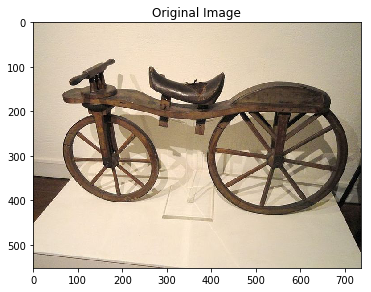

Original Shape: (552, 736, 3)


In [ ]:
io.imshow(image)
plt.title('Original Image')
io.show()

print('Original Shape: '+str(image.shape))

vertical_seams = 20
horizontal_seams = 30
crop_image = deletion(image,vertical_seams,horizontal_seams)
io.imshow(crop_image)
plt.title('Cropped Image')
io.show()
io.imsave('images/horizontal_vertical_deletion.jpg',crop_image)
print('Cropped Image Shape: '+str(crop_image.shape))

## 3.4 Seam Carving + Resizing

### 3.4.1 Implementation

In [19]:

def deletion_resizing(image,exp_rows,exp_cols,thr):
    crop_image = image
    energy_image = energy_map(crop_image)

    exp_shape= [exp_rows,exp_cols]
    rows = crop_image.shape[0]-exp_rows
    cols = crop_image.shape[1]-exp_cols
    real_shape = image.shape

    cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)
    cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
    max_en_h = np.max(cumulative_energy_h.T[-1])
    max_en_v = np.max(cumulative_energy_v[-1])
    valid_y = min(rows,sum(i < max_en_v*thr for i in cumulative_energy_h.T[-1]))
    valid_x = min(cols,sum(i < max_en_h*thr for i in cumulative_energy_v[-1]))

    print("Expected new shape: "+str(exp_shape))
    print("Number of possible horizontal seams :"+str(valid_y)+" vertical seams: "+str(valid_x))

    del_seams1 = [valid_y,real_shape[1]-(exp_shape[1]*(real_shape[0]-valid_y)/exp_shape[0])]
    del_seams2 = [real_shape[0]-(exp_shape[0]*(real_shape[1]-valid_x)/exp_shape[1]),valid_x]

    #print("delete option 1: "+str(del_seams1)+" option 2: "+str(del_seams2))
    if(del_seams1[1]>= 0 and del_seams1[1]<valid_x ):
        cols_sc = round(del_seams1[1])
        rows_sc = round(del_seams1[0])
        cols_rz = cols - cols_sc
        rows_rz = rows - rows_sc
    else:
        cols_sc = round(del_seams2[1])
        rows_sc = round(del_seams2[0])
        cols_rz = cols - cols_sc
        rows_rz = rows - rows_sc

    if(cols_sc*rows_sc<=0):
        cols_sc = 0
        rows_sc = 0
        cols_rz = cols
        rows_rz = rows
    print("seam carving: "+str(cols_sc)+" "+str(rows_sc)+" resize "+str(cols_rz)+" "+str(rows_rz))

    while(cols_sc+rows_sc != 0):
        if(cols_sc == 0):
            
            crop_image = delete_minimum_horizontal_path(cumulative_energy_h, path_h, crop_image)
            energy_image = energy_map(crop_image)
            cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
            cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image) 
            rows_sc=rows_sc-1
        elif(rows_sc == 0):
            
            crop_image = delete_minimum_vertical_path(cumulative_energy_v, path_v, crop_image)
            energy_image = energy_map(crop_image)
            cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)
            cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
            cols_sc = cols_sc-1

        else:    
            min_cumulative_v = np.argmin(cumulative_energy_v[-1])
            min_cumulative_h = np.argmin(cumulative_energy_h.T[-1])

            if(min_cumulative_v < min_cumulative_h):

                crop_image = delete_minimum_vertical_path(cumulative_energy_v, path_v, crop_image)
                energy_image = energy_map(crop_image)
                cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)
                cols_sc = cols_sc-1
            else:
               
                crop_image = delete_minimum_horizontal_path(cumulative_energy_h, path_h, crop_image)
                energy_image = energy_map(crop_image)
                cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
                rows_sc=rows_sc-1

    crop_image = transform.resize(crop_image,(exp_shape[0],exp_shape[1]))
    return crop_image

### 3.4.2 - Testing

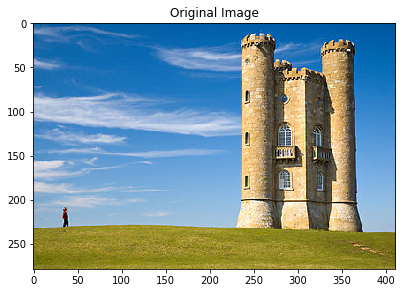

Original Shape: (279, 411, 3)
Expected new shape: [111, 159]
Number of possible horizontal seams :168 vertical seams: 106
seam carving: 106 66.0 resize 146 102.0


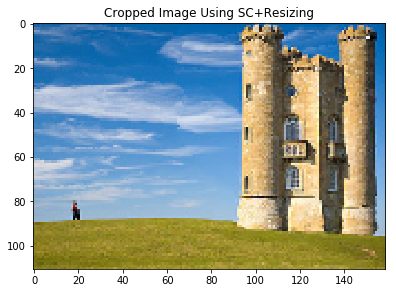

Cropped Image Shape: (111, 159, 3)


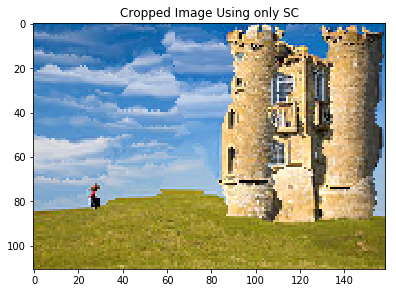

Cropped Image Shape: (111, 159, 3)


In [30]:
io.imshow(image)
plt.title('Original Image')
io.show()
shape= image.shape

print('Original Shape: '+str(image.shape))

vertical_seams = 111
horizontal_seams = 159
thr = 0.7

crop_image = deletion_resizing(image,vertical_seams,horizontal_seams,thr)
io.imshow(crop_image)
plt.title('Cropped Image Using SC+Resizing')
io.show()

print('Cropped Image Shape: '+str(crop_image.shape))
io.imsave('images/seam_carving_resizing.jpg',crop_image) # Notebook resize it because of the small size

#Normal Deletion for comparission
crop_image = deletion(image,shape[0]-vertical_seams,shape[1]-horizontal_seams)
io.imshow(crop_image)
plt.title('Cropped Image Using only SC')
io.show()

print('Cropped Image Shape: '+str(crop_image.shape))
io.imsave('images/seam_carving_no_resizing.jpg',crop_image)

# 4 - INSERTION

## 4.1 Implementation

In [15]:

def insert_minimum_vertical_path(cumulative_energy, path, image,paths_number):
    """
    returns the image with added minimum paths
    """
    shape = image.shape # (height, width) or (rows, cols)
    #Make empty copy of image
    if len(shape) == 3:
        ret_image = np.zeros((shape[0],shape[1]+paths_number,shape[2]),dtype=image.dtype)
    else:
        ret_image = np.zeros((shape[0],shape[1]+paths_number),dtype=image.dtype)
       
    # find the minimum values in the last row of the cumulative energy image (indeces)
    seam_row = shape[0]-1 
    seam_col_array = np.argpartition(cumulative_energy[-1], paths_number)[:paths_number]
    #order seam_col 
    seam_col_array = sorted(seam_col_array, key=int, reverse=True)
    #Go through all the seams
    flag = 0 #flag for case when it's right border (cause i will take another neighbor then)
    while seam_row >= 0:
        aux_row = image[seam_row]
        for i in range(0,len(seam_col_array)):
            seam_col = seam_col_array[i] #  easy
            if (image.shape[1]-1 == seam_col): #first we check whether it's right border or not. If yes move coordinate, check the flag 
                idx = np.where(seam_col=image.shape[1]-1)
                seam_col_array[idx] -= 1
                flag = 1
                #print('possible error')
            if len(shape)==3: #if RGB find mean pixel

                pixel = (image[seam_row,seam_col].astype(float)+image[seam_row,seam_col+1].astype(float))/2
                pixel = pixel.astype(int)
            else: #if BW find mean pixel
                pixel1 = image[seam_row][seam_col]
                pixel2 = image[seam_row][seam_col+1]
                pixel = round((pixel1+pixel2)/2)
            if flag == 1: #return to previous coordinate
                seam_col_array[idx]+=1
                flag = 0
    
            aux_row = np.insert(aux_row,seam_col,pixel,0)
            seam_col_array[i] = path[seam_row][seam_col]
                
        ret_image[seam_row] = aux_row
        
        seam_row -= 1
        seam_col_array = sorted(seam_col_array, key=int, reverse=True)
    
    return ret_image


   

In [16]:
def insert_minimum_horizontal_path(cumulative_energy,path,image,paths_number):
    return insert_minimum_vertical_path(cumulative_energy.T,path.T,image.transpose(1,0,2),paths_number).transpose(1,0,2)

## 4.2 Visualization

In [18]:
def draw_minimum_vertical_insertion_path(cumulative_energy, path, image,paths_number):
    """
    returns the image with added minimum paths
    """
    shape = image.shape # (height, width) or (rows, cols)
    #Make empty copy of image
    if len(shape) == 3:
        ret_image = np.zeros((shape[0],shape[1]+paths_number,shape[2]),dtype=image.dtype)
    else:
        ret_image = np.zeros((shape[0],shape[1]+paths_number),dtype=image.dtype)
       
    # find the minimum values in the last row of the cumulative energy image (indeces)
    seam_row = shape[0]-1 
    seam_col_array = np.argpartition(cumulative_energy[-1], paths_number)[:paths_number]
    #order seam_col 
    seam_col_array = sorted(seam_col_array, key=int, reverse=True)
    #Go through all the seams
    flag = 0 #flag for case when it's right border (cause i will take another neighbor then)
    while seam_row >= 0:
        aux_row = image[seam_row]
        for i in range(0,len(seam_col_array)):
            seam_col = seam_col_array[i] #  easy
            
            if len(shape)==3: #if RGB find mean pixel

                pixel = [[255,0,0]]
            else: #if BW 
                pixel = 255
                
            if flag == 1: #return to previous coordinate
                seam_col_array[idx]+=1
                flag = 0
    
            aux_row = np.insert(aux_row,seam_col,pixel,0)
            seam_col_array[i] = path[seam_row][seam_col]
                
        ret_image[seam_row] = aux_row
        
        seam_row -= 1
        seam_col_array = sorted(seam_col_array, key=int, reverse=True)
    
    return ret_image


In [19]:
def draw_minimum_horizontal_insertion_path(cumulative_energy,path,image,paths_number):
    return draw_minimum_vertical_insertion_path(cumulative_energy.T,path.T,image.transpose(1,0,2),paths_number).transpose(1,0,2)

## 4.3 Testing

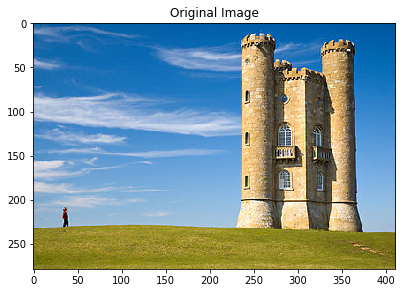

Original Shape: (279, 411, 3)


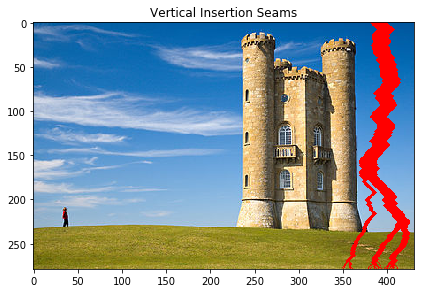

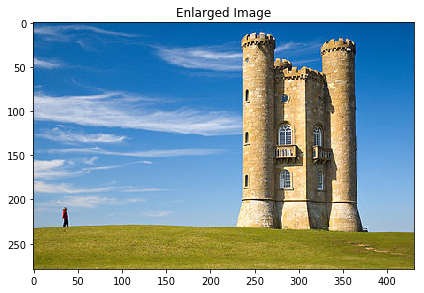

Enlarged Image Shape: (279, 431, 3)


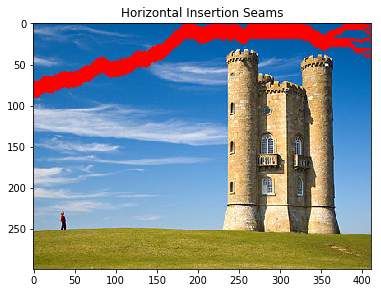

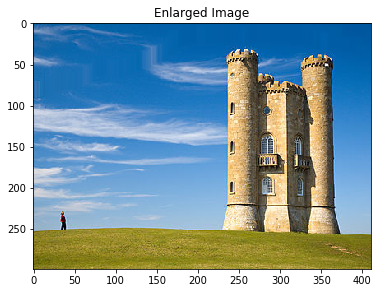

Enlarged Image Shape: (299, 411, 3)


In [79]:

plt.figure()
io.imshow(image)
plt.title('Original Image')
io.show()

print('Original Shape: '+str(image.shape))

#Adding 20 seam
vertical_seams = 20
plt.figure()
enlarged_draw_image = draw_minimum_vertical_insertion_path(cumulative_energy_v, path_v, image,vertical_seams)
io.imshow(enlarged_draw_image)
plt.title('Vertical Insertion Seams')
io.show()

io.imsave('images/seam_carving_vertical_insertion_draw.jpg',enlarged_draw_image) # Notebook resize it because of the small size


plt.figure()
enlarged_image = insert_minimum_vertical_path(cumulative_energy_v, path_v, image,vertical_seams)
io.imshow(enlarged_image)
plt.title('Enlarged Image')
io.show()

io.imsave('images/seam_carving_vertical_insertion.jpg',enlarged_image) # Notebook resize it because of the small size

print('Enlarged Image Shape: '+str(enlarged_image.shape))

horizontal_seams = 20

plt.figure()
enlarged_draw_image = draw_minimum_horizontal_insertion_path(cumulative_energy_h, path_h, image,horizontal_seams)
io.imshow(enlarged_draw_image)
plt.title('Horizontal Insertion Seams')
io.show()

io.imsave('images/seam_carving_horizontal_insertion_draw.jpg',enlarged_draw_image) # Notebook resize it because of the small size


plt.figure()
enlarged_image = insert_minimum_horizontal_path(cumulative_energy_h, path_h, image,horizontal_seams)
io.imshow(enlarged_image)
plt.title('Enlarged Image')
io.show()

io.imsave('images/seam_carving_horizontal_insertion.jpg',enlarged_image) # Notebook resize it because of the small size


print('Enlarged Image Shape: '+str(enlarged_image.shape))


# Annex

In this section, we will show all the steps during deletion process

In [74]:
def deletion_with_visualization(image,rows,cols):
    crop_image = image
    energy_image = energy_map(crop_image)

    cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)
    cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
    io.imshow(crop_image)
    io.show()
    while(cols+rows != 0):
        if(cols == 0):
            seam_image = draw_minimum_horizontal_path(cumulative_energy_h, path_h, crop_image)

            crop_image = delete_minimum_horizontal_path(cumulative_energy_h, path_h, crop_image)
            energy_image = energy_map(crop_image)
            cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
            cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image) 
            rows=rows-1
        elif(rows == 0):
            seam_image = draw_minimum_vertical_path(cumulative_energy_v, path_v, crop_image)

            crop_image = delete_minimum_vertical_path(cumulative_energy_v, path_v, crop_image)
            energy_image = energy_map(crop_image)
            cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)
            cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
            cols = cols-1

        else:    
            min_cumulative_v = np.argmin(cumulative_energy_v[-1])
            min_cumulative_h = np.argmin(cumulative_energy_h.T[-1])

            if(min_cumulative_v < min_cumulative_h):
                seam_image = draw_minimum_vertical_path(cumulative_energy_v, path_v, crop_image)

                crop_image = delete_minimum_vertical_path(cumulative_energy_v, path_v, crop_image)
                energy_image = energy_map(crop_image)
                cumulative_energy_v, path_v = dynamic_energy_vertical(energy_image)
                cols = cols-1
            else:
                seam_image = draw_minimum_horizontal_path(cumulative_energy_h, path_h, crop_image)

                crop_image = delete_minimum_horizontal_path(cumulative_energy_h, path_h, crop_image)
                energy_image = energy_map(crop_image)
                cumulative_energy_h, path_h = dynamic_energy_horizontal(energy_image)
                rows= rows-1
        
        io.imshow(seam_image)
        io.show()
        
    return crop_image

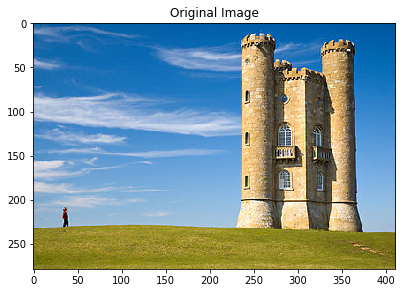

Original Image Shape: (279, 411, 3)


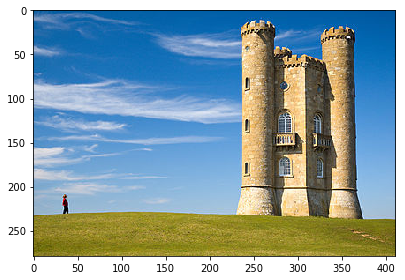

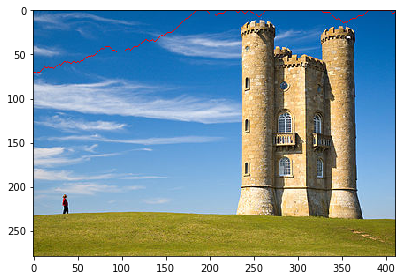

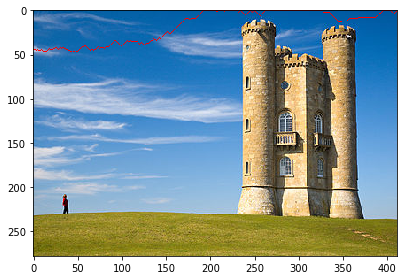

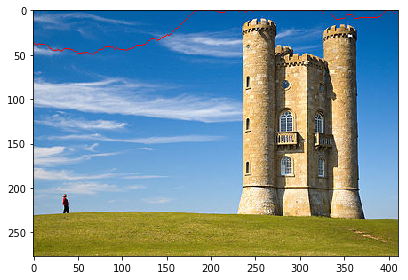

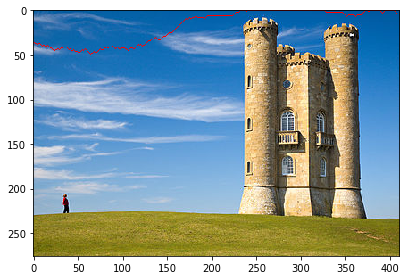

...

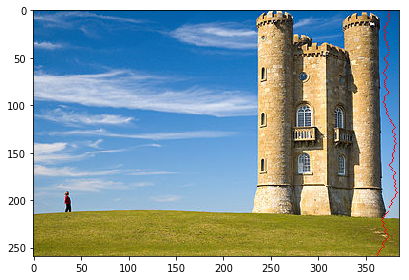

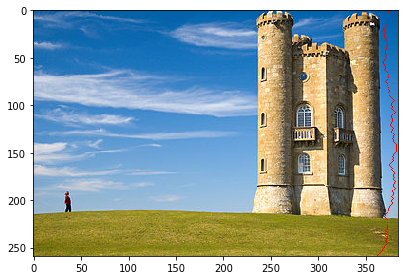

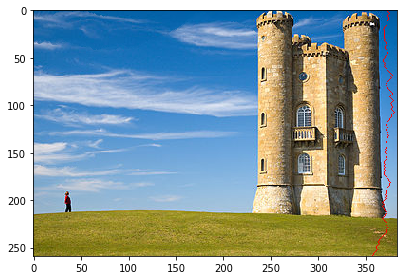

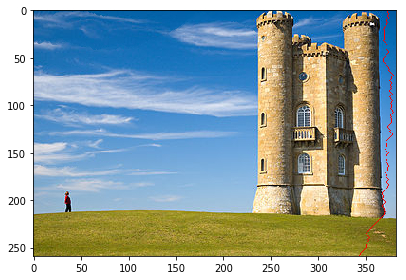

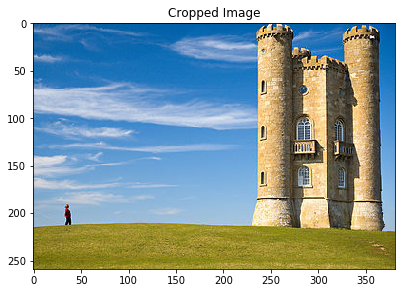

Cropped Image Shape: (259, 381, 3)


In [76]:
io.imshow(image)
plt.title('Original Image')
io.show()

print('Original Image Shape: '+str(image.shape))
vertical_seams = 20
horizontal_seams = 30

crop_image = deletion_with_visualization(image,vertical_seams,horizontal_seams)
io.imshow(crop_image)
plt.title('Cropped Image')
io.show()

print('Cropped Image Shape: '+str(crop_image.shape))